In [1]:
using PlotlyJS
using Statistics
using BenchmarkTools
using DataFrames
using JSON
using StatsBase
using Random
using Distributions
using KernelDensity
using ProgressBars
using CSV
using DataFramesMeta
using PlotlyBase
using DataStructures

include("armoptimize.jl")
include("ARM.jl")

paramMap (generic function with 1 method)

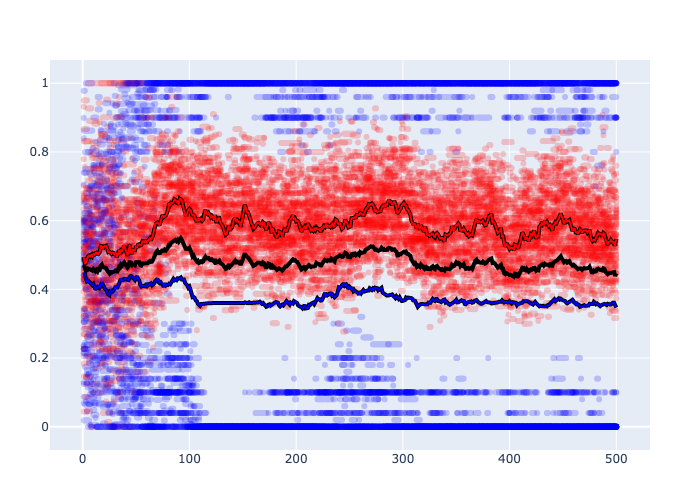

In [2]:
agents1::Vector{Agent} = []
group = 'B'
for i in 1:100
    group = 'B' == group ? 'A' : 'B'
    mean = group == 'B' ? .45 : .55
    push!(agents1, Agent(i, limit(randn() / 5 + mean, "norm"), .2, .4, .1, group))
end
res = runARM(500, agents1, true, false);

p = plot()
res_mat = hcat(res...)

A_group = []
B_group = []

for i in 1:size(res_mat,1)
    color = agents1[i].group == 'A' ? "red" : "blue"
    if color == "red"
        push!(A_group, res_mat[i,:])
    else
        push!(B_group, res_mat[i,:])
    end
    trace = scatter(x=1:length(res_mat[i,:]), y=res_mat[i,:], mode="markers", marker_color=color, opacity=.2)
    add_trace!(p, trace)
end

A_mean = mean(A_group, dims=1)[1]
B_mean = mean(B_group, dims=1)[1]
total_mean = (A_mean .+ B_mean) ./ 2

A_trace = scatter(x=1:length(res_mat[1,:]), y=A_mean, mode="lines", marker_color="red", opacity=1)
A_outline = scatter(x=1:length(res_mat[1,:]), y=A_mean, mode="lines", marker_color="black", opacity=1, line=(width=4,))
add_trace!(p, A_outline)
add_trace!(p, A_trace)

B_trace = scatter(x=1:length(res_mat[1,:]), y=B_mean, mode="lines", marker_color="blue", opacity=1)
B_outline = scatter(x=1:length(res_mat[1,:]), y=B_mean, mode="lines", marker_color="black", opacity=1, line=(width=4,))
add_trace!(p, B_outline)
add_trace!(p, B_trace)

mean_trace = scatter(x=1:length(res_mat[1,:]), y=total_mean, mode="lines", marker_color="black", opacity=1, line=(width=4,))
add_trace!(p, mean_trace)

relayout!(p, width=600, height=600, showlegend=false)

p

### Analytical Exploration

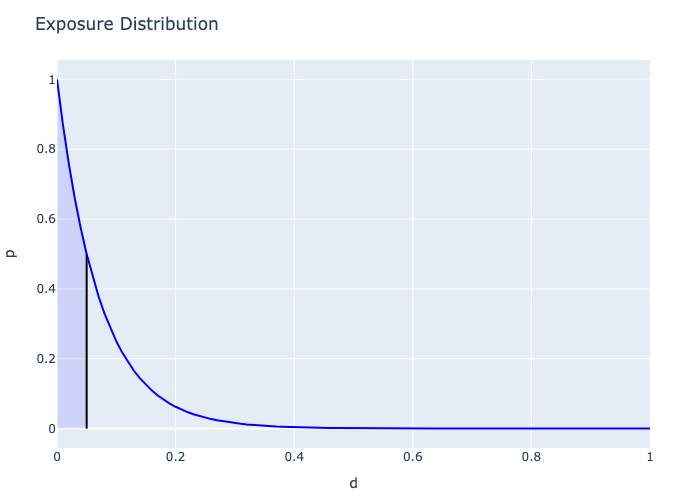

In [3]:
include("armoptimize.jl")
ideological_exposure()

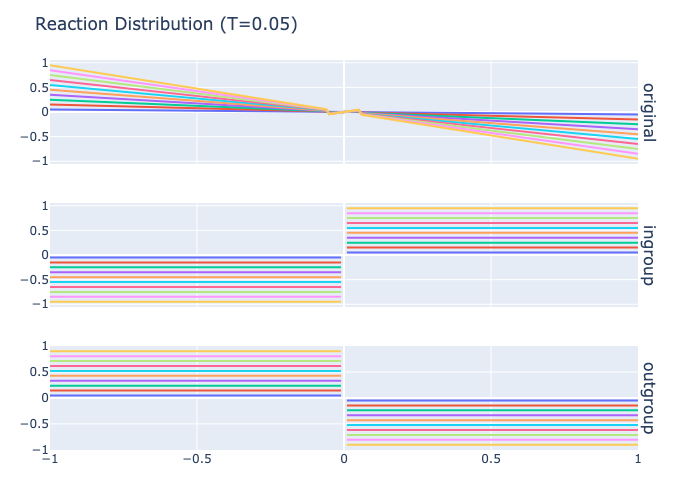

In [4]:
ideological_reaction(.05)

## Empirical Fit

### ANES Data

In [5]:
df = CSV.read("raw_data/anes_timeseries_cdf_csv_20220916/anes_timeseries_cdf_csv_20220916.csv", DataFrame);
filtered_df = df[(df[:, "VCF0302"] .== "1") .| (df[:, "VCF0302"] .== "5"), :];

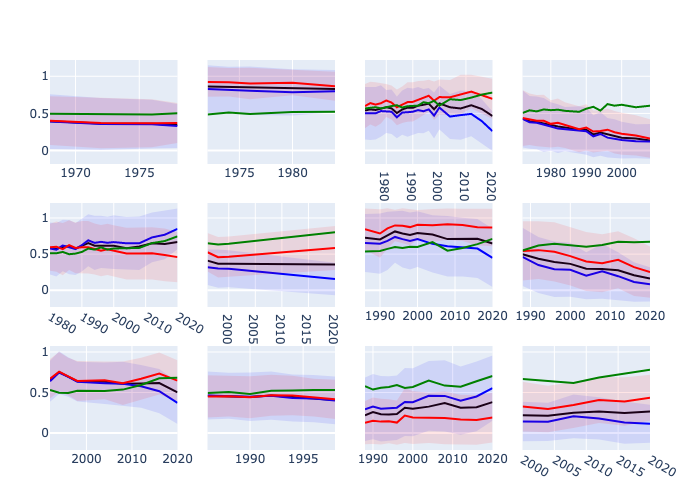

In [6]:
include("armoptimize.jl")
var_map = SortedDict{String, String}(
    "VCF0834" => "Women should be in the home?", # 7
    "VCF0838" => "Should abortion be legal?", #16
    "VCF0876a" => "Laws shouldn't protect homosexuality?", #9
    "VCF0879" => "Decrease number of immigrants?", #9
    "VCF9043" => "Should school prayer be allowed?", #7
    "VCF9237" => "Oppose death penalty?", #5
    "VCF9238" => "Should be easier to buy guns?", #6
    "VCF0830" => "Blacks shouldn't have aid?", #17
    "VCF0867a" => "Oppose Affirmative Action?", #12
    "VCF0815" => "Segregation", #6
    "VCF0817" => "There shouldn't be school busing for integration?", #5
    "VCF0842" => "Environmental Regulation is too burdensome?" #4
);

plots = []
p = make_subplots(
    rows=floor(Int, length(var_map) / 4), cols=4,
    shared_yaxes=true,
)

ctr = 0
full_results = Dict{String, Any}()
for variable in keys(var_map)

    res = get_series(filtered_df, variable)
    full_results[variable] = res
    traces = display_series(res, var_map)
    
    for t in traces
        add_trace!(p, t, row=floor(Int, ctr / 4) + 1, col=ctr % 4 + 1)
    end

    relayout!(p)
    ctr += 1

end

relayout!(p, showlegend=false, height=600)
p

In [7]:
open("outputs/base_optimals.json", "r") do f
    global base_optimals = JSON.parse(f)
end;

open("outputs/id_optimals.json", "r") do f
    global id_optimals = JSON.parse(f)
end;

open("outputs/h_optimals.json", "r") do f
    global h_optimals = JSON.parse(f)
end;

open("outputs/id_h_optimals.json", "r") do f
    global id_h_optimals = JSON.parse(f)
end;

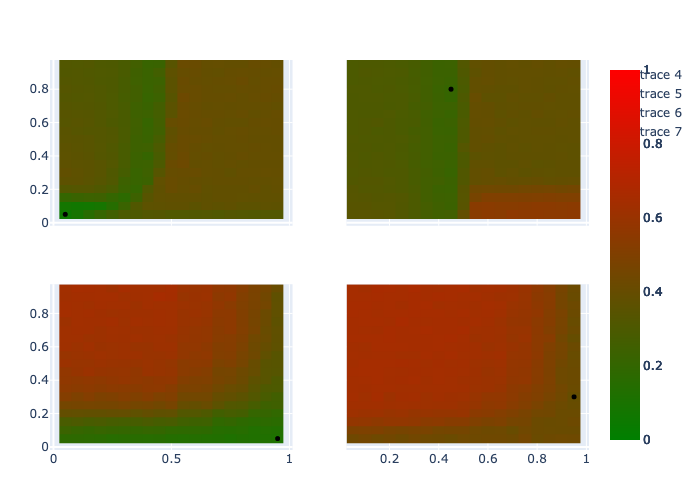

In [8]:
include("armoptimize.jl")
p = make_subplots(
      rows=2, 
      cols=2, 
      shared_xaxes=true,
      shared_yaxes=true,
    )

base = Matrix{Any}(undef, 0, 0)
id = Matrix{Any}(undef, 0, 0)
h = Matrix{Any}(undef, 0, 0)
id_h = Matrix{Any}(undef, 0, 0)
rng = [i for i in .05:.05:.95]
losses = ["sorted", "variance", "quantized", "change"]
for loss in losses
  variable = "VCF0830"
  
  mini = minimum([
    minimum([i[4][variable][loss] for i in base_optimals]), 
    minimum([i[4][variable][loss] for i in h_optimals]), 
    minimum([i[4][variable][loss] for i in id_optimals]), 
    minimum([i[4][variable][loss] for i in id_h_optimals])
    ]
  )
  maxi = maximum([
    maximum([i[4][variable][loss] for i in base_optimals]), 
    maximum([i[4][variable][loss] for i in h_optimals]), 
    maximum([i[4][variable][loss] for i in id_optimals]), 
    maximum([i[4][variable][loss] for i in id_h_optimals])
    ]
  )

  if loss == losses[1]
    base = optimalMap(base_optimals, variable, loss, mini, maxi,  -1., -1., .25, rng, rng, true)
    id = optimalMap(id_optimals, variable, loss, mini, maxi,  -1., -1., .25, rng, rng, true)
    h = optimalMap(h_optimals, variable, loss, mini, maxi,  -1., -1., .25, rng, rng, true)
    id_h = optimalMap(id_h_optimals, variable, loss, mini, maxi,  -1., -1., .25, rng, rng, true)
  else
    base = base .+ optimalMap(base_optimals, variable, loss, mini, maxi,  -1., -1., .25, rng, rng, true)
    id = id .+ optimalMap(id_optimals, variable, loss, mini, maxi,  -1., -1., .25, rng, rng, true)
    h = h .+ optimalMap(h_optimals, variable, loss, mini, maxi,  -1., -1., .25, rng, rng, true)
    id_h = id_h .+ optimalMap(id_h_optimals, variable, loss, mini, maxi,  -1., -1., .25, rng, rng, true)
  end

end

base = base ./ length(losses)
id = id ./ length(losses)
h = h ./ length(losses)
id_h = id_h ./ length(losses)

add_trace!(p, heatmap(z=base, x=rng, y=rng, zmin=0, zmax=1, colorscale=[[0, "rgb(0,128,0)"], [1, "rgb(255,0,0)"]]), row=1, col=1)
add_trace!(p, heatmap(z=h, x=rng, y=rng, zmin=0, zmax=1, colorscale=[[0, "rgb(0,128,0)"], [1, "rgb(255,0,0)"]]), row=1, col=2)
add_trace!(p, heatmap(z=id, x=rng, y=rng, zmin=0, zmax=1, colorscale=[[0, "rgb(0,128,0)"], [1, "rgb(255,0,0)"]]), row=2, col=1)
add_trace!(p, heatmap(z=id_h, x=rng, y=rng, zmin=0, zmax=1, colorscale=[[0, "rgb(0,128,0)"], [1, "rgb(255,0,0)"]]), row=2, col=2)

using LinearAlgebra
minval, minindex = findmin(base)
add_trace!(p, scatter(x=[rng[minindex[2]]], y=[rng[minindex[1]]], mode="markers", marker_size=5, marker_color="black"), row=1, col=1)

minval, minindex = findmin(h)
add_trace!(p, scatter(x=[rng[minindex[2]]], y=[rng[minindex[1]]], mode="markers", marker_size=5, marker_color="black"), row=1, col=2)

minval, minindex = findmin(id)
add_trace!(p, scatter(x=[rng[minindex[2]]], y=[rng[minindex[1]]], mode="markers", marker_size=5, marker_color="black"), row=2, col=1)

minval, minindex = findmin(id_h)
add_trace!(p, scatter(x=[rng[minindex[2]]], y=[rng[minindex[1]]], mode="markers", marker_size=5, marker_color="black"), row=2, col=2)


relayout!(
      p, 
      showlegend=true, 
      width=500, 
      height=500,
      barmode="overlay"
    )

p

In [9]:
std([[0,1], [0,2]])

2-element Vector{Float64}:
 0.0
 0.7071067811865476

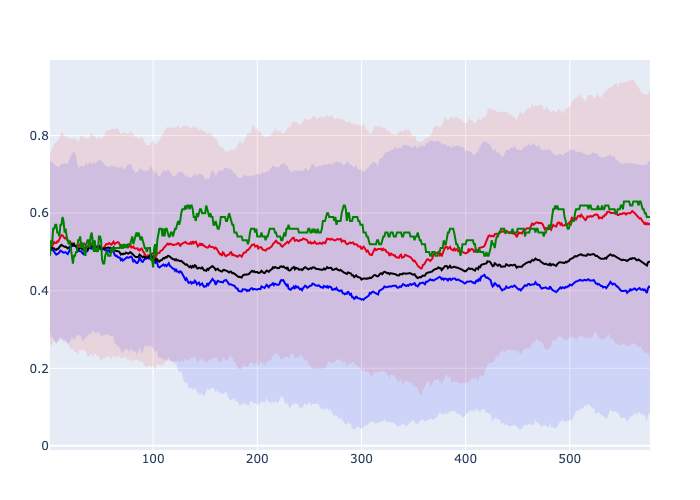

In [167]:
variable = "VCF0830"
n_dems = floor(full_results[variable]["stats"]["perc_dem"] * 100)
mean_dems = full_results[variable]["dem_stats"]["mean"][1]
var_dems = full_results[variable]["dem_stats"]["variance"][1]
mean_reps = full_results[variable]["rep_stats"]["mean"][1]
var_reps = full_results[variable]["rep_stats"]["variance"][1]
variance = full_results[variable]["stats"]["variance"][1]

# one cycle is a month
n_steps = (full_results[variable]["years"][end] - full_results[variable]["years"][1]) * 12 + 1

agents::Vector{Agent} = []
for i in 1:100

    if i < n_dems
        push!(agents, Agent(i, limit(randn() * var_reps^.5 + mean_reps, "norm"), .05, .8, .1, 'A'))
    else
        push!(agents, Agent(i, limit(randn() * var_dems^.5 + mean_dems, "norm"), .05, .8, .1, 'B'))
    end

end
res = runARM(n_steps, agents, true, false);

p = plot()
res_mat = hcat(res...)

A_group = []
B_group = []
total_group = []

for i in 1:size(res_mat,1)
    color = agents[i].group == 'A' ? "red" : "blue"
    if color == "red"
        push!(A_group, res_mat[i,:])
    else
        push!(B_group, res_mat[i,:])
    end
    push!(total_group, res_mat[i,:])
    # trace = scatter(x=1:length(res_mat[i,:]), y=res_mat[i,:], mode="markers", marker_color=color, opacity=.2)
    # add_trace!(p, trace)
end

A_mean = mean(A_group)
B_mean = mean(B_group)
total_mean = mean(total_group)

sortedness = []
for t in 1:length(A_group[1])
    push!(sortedness, sorted_measure([a[t] for a in A_group], [b[t] for b in B_group]))
end

A_trace = scatter(x=1:length(res_mat[1,:]), y=A_mean, mode="lines", marker_color="red", opacity=1)
A_outline = scatter(x=1:length(res_mat[1,:]), y=A_mean, mode="lines", marker_color="black", opacity=1, line=(width=4,))
# add_trace!(p, A_outline)
add_trace!(p, A_trace)

A_std1 = scatter(
    x=1:length(res_mat[1,:]), 
    y=A_mean .+ std(A_group),
    mode="lines", 
    line_width=0
)
add_trace!(p, A_std1)

A_std2 = scatter(
    x=1:length(res_mat[1,:]), 
    y=A_mean .- std(A_group),
    mode="lines", 
    line_width=0,
    fill="tonexty",
    fillcolor="rgba(255, 0, 0, 0.1)"
)
add_trace!(p, A_std2)

B_trace = scatter(x=1:length(res_mat[1,:]), y=B_mean, mode="lines", marker_color="blue", opacity=1)
B_outline = scatter(x=1:length(res_mat[1,:]), y=B_mean, mode="lines", marker_color="black", opacity=1, line=(width=4,))
# add_trace!(p, B_outline)
add_trace!(p, B_trace)

B_std1 = scatter(
    x=1:length(res_mat[1,:]), 
    y=B_mean .+ std(B_group),
    mode="lines", 
    line_width=0
)
add_trace!(p, B_std1)

B_std2 = scatter(
    x=1:length(res_mat[1,:]), 
    y=B_mean .- std(B_group),
    mode="lines", 
    line_width=0,
    fill="tonexty",
    fillcolor="rgba(0, 0, 255, 0.1)"
)
add_trace!(p, B_std2)

mean_trace = scatter(x=1:length(res_mat[1,:]), y=total_mean, mode="lines", marker_color="black", opacity=1)
add_trace!(p, mean_trace)

sorted_trace = scatter(x=1:length(res_mat[1,:]), y=sortedness, mode="lines", marker_color="green", opacity=1)
sorted_outline = scatter(x=1:length(res_mat[1,:]), y=sortedness, mode="lines", marker_color="black", opacity=1, line=(width=4,))
# add_trace!(p, sorted_outline)
add_trace!(p, sorted_trace)

relayout!(p, width=600, height=600, showlegend=false)

p

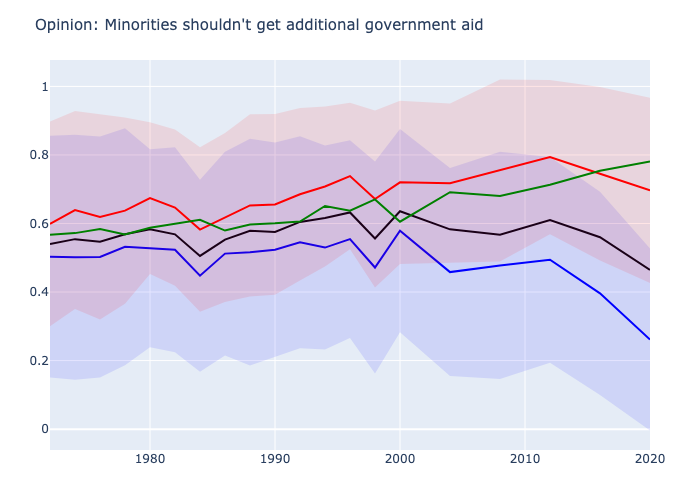

In [11]:
variable = "VCF0830"

plot(display_series(full_results[variable], var_map), 
Layout(
    showlegend=false,
    title=attr(text="Opinion: Minorities shouldn't get additional government aid", font=attr(size=15)),
    width=500,
    height=500
))

